In [1]:
import sys
import os
import time

from so101_sim import task_suite
import numpy as np
from PIL import Image
from scripts.image_utils import display_images

In [2]:
def plot_images(obs, cameras=('overhead_cam', 'side_cam', 'wrist_cam')):
    np_img_top = obs[cameras[0]]  # 480x640x3 RGB image
    np_img_side = obs[cameras[1]]
    np_img_wrist = obs[cameras[2]]
    img_t = Image.fromarray(np_img_top)
    img_s = Image.fromarray(np_img_side)
    img_w = Image.fromarray(np_img_wrist)

    display_images(img_t, img_s, img_w)

Last residual velocity=0.000601897362407966 and acceleration=0.6772445037571756.
This suggests your dynamics are unstable. Consider:
	1. Increasing `max_settle_physics_attempts`
	2. Increasing `max_settle_physics_time`
	3. Tuning your contact parameters or initial pose distributions.


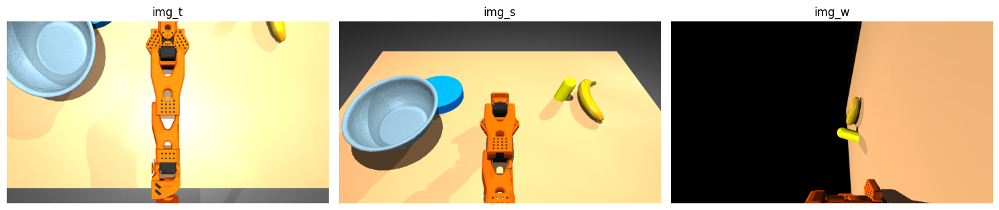

In [3]:
# Create environment with real robot
cameras = ('overhead_cam', 'front_cam', 'wrist_cam')
env = task_suite.create_task_env(
    task_name='SO100HandOverBanana',
    time_limit=30.0,
    cameras=cameras,
    image_observation_enabled=True,
)

timestep = env.reset()
plot_images(timestep.observation, cameras=cameras)

In [4]:
# Reset to home position
timestep = env.reset()

# Example movements
base_rotation = [0.5, 0, 0, 0, 0, 0]      # Rotate base
shoulder_move = [0, 0.3, 0, 0, 0, 0]      # Move shoulder
elbow_bend = [0, 0, 0.5, 0, 0, 0]         # Bend elbow
wrist_move = [0, 0, 0, 0.3, 0.2, 0]       # Move wrist
gripper_open = [0, 0, 0, 0, 0, 0.5]       # Open gripper

# Execute action
timestep = env.step(np.array(gripper_open))
print(f"Observation: {timestep.observation}")
print(f"Reward: {timestep.reward}")
print(f"Discount: {timestep.discount}")

Observation: {'overhead_cam': array([[[255, 235, 158],
        [255, 235, 158],
        [255, 235, 158],
        ...,
        [255, 242, 164],
        [255, 242, 164],
        [255, 242, 163]],

       [[255, 235, 158],
        [255, 235, 158],
        [255, 235, 158],
        ...,
        [255, 242, 164],
        [255, 242, 164],
        [255, 242, 164]],

       [[255, 235, 158],
        [255, 235, 158],
        [255, 235, 158],
        ...,
        [255, 242, 164],
        [255, 242, 164],
        [255, 242, 164]],

       ...,

       [[ 86,  86,  86],
        [ 86,  86,  86],
        [ 86,  86,  86],
        ...,
        [ 98,  98,  98],
        [ 98,  98,  98],
        [ 98,  98,  98]],

       [[ 86,  86,  86],
        [ 86,  86,  86],
        [ 86,  86,  86],
        ...,
        [ 98,  98,  98],
        [ 98,  98,  98],
        [ 98,  98,  98]],

       [[ 86,  86,  86],
        [ 86,  86,  86],
        [ 86,  86,  86],
        ...,
        [ 98,  98,  98],
        [ 98,  98, 

In [4]:
class MockPolicy:
    """Mock policy that generates smooth movements for a specified joint within its range"""
    def __init__(self, joint='s1', cycle_steps=100):
        self.cycle_steps = cycle_steps
        self.step_counter = 0
        self.joint = joint
        
        # Joint ranges and indices
        self.joint_ranges = {
            's0': {'idx': 0, 'min': -50, 'max': 50, 'name': 'shoulder_pan'},
            's1': {'idx': 1, 'min': 40, 'max': 180, 'name': 'shoulder_lift'},
            's2': {'idx': 2, 'min': 30, 'max': 160, 'name': 'elbow_flex'},
            's3': {'idx': 3, 'min': -30, 'max': 90, 'name': 'wrist_flex'},
            's4': {'idx': 4, 'min': -90, 'max': 90, 'name': 'wrist_roll'},
            's5': {'idx': 5, 'min': 0, 'max': 100, 'name': 'gripper'}
        }
        
        # Get range for selected joint
        self.joint_info = self.joint_ranges[joint]
        self.joint_idx = self.joint_info['idx']
        
        # Calculate movement parameters
        self.mid_value = (self.joint_info['max'] + self.joint_info['min']) / 2
        self.amplitude = (self.joint_info['max'] - self.joint_info['min']) / 2
        
        #print(f"Testing {self.joint_info['name']} (joint {joint})")
        #print(f"Range: {self.joint_info['min']} to {self.joint_info['max']}")
        
    def select_action(self, observation):
        """Generate smooth sinusoidal movements for selected joint"""
        # Get current state
        current_state = observation['joints_pos']
        
        # Create action: copy current state but modify selected joint
        action = current_state
        
        # Calculate smooth sinusoidal movement
        phase = 2 * np.pi * (self.step_counter % self.cycle_steps) / self.cycle_steps
        joint_value = self.mid_value + self.amplitude * np.sin(phase)
        
        # Set joint value
        action[self.joint_idx] = joint_value
        
        self.step_counter += 1
        return action

Action: [  0. 110.   0.   0.   0.   0.]


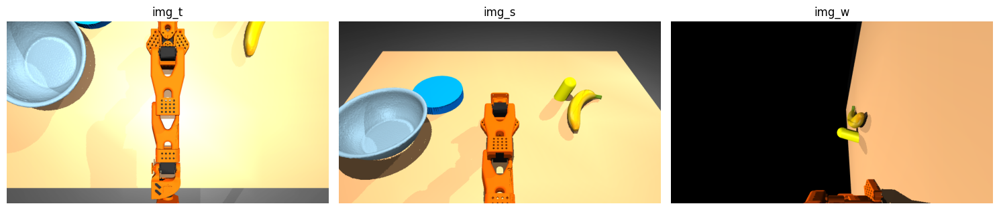

Action: [  0.         114.39533637   0.           0.           0.
   0.        ]


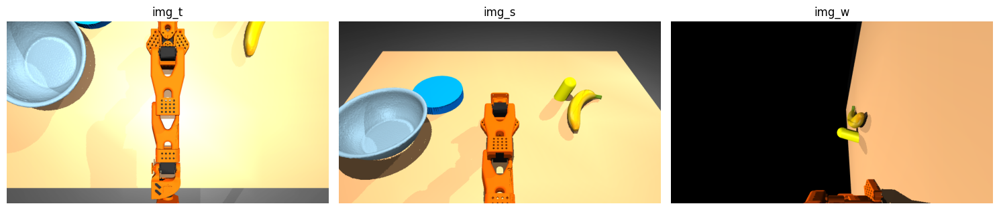

Action: [  0.         118.77332635   0.           0.           0.
   0.        ]


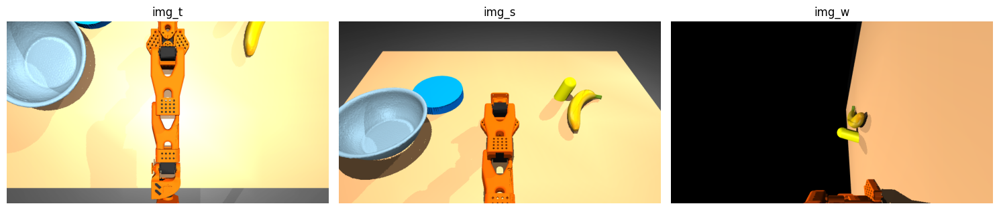

Action: [  0.         123.11669202   0.           0.           0.
   0.        ]


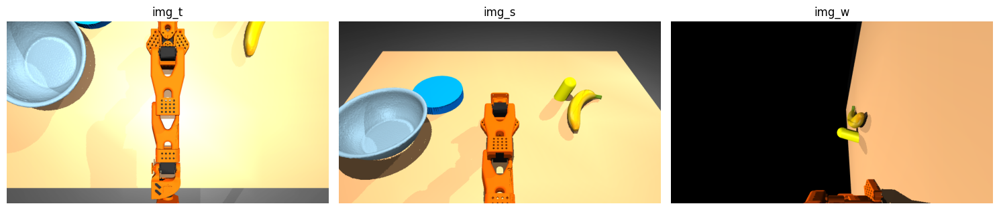

Action: [  0.        127.4082921   0.          0.          0.          0.       ]


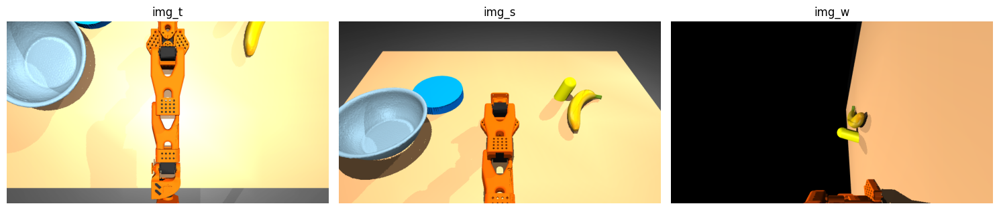

Action: [  0.         131.63118961   0.           0.           0.
   0.        ]


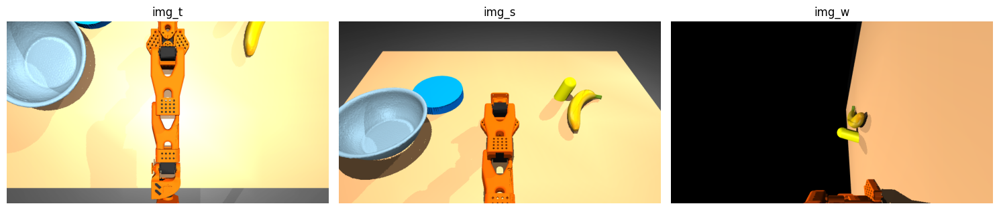

Action: [ 5.85192160e-02  1.35768719e+02  6.58658498e-02 -8.00624348e-02
  7.67682376e-02 -7.65953670e-02]


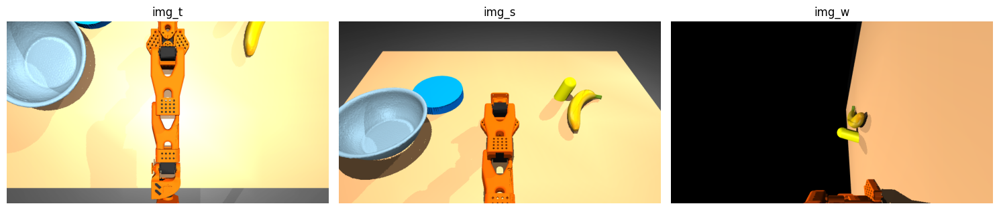

Action: [  0.19077612 139.80455041   0.22451177  -0.31683829   0.29594145
  -0.25833976]


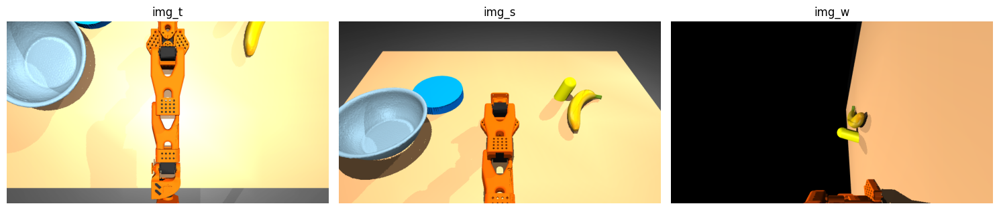

Action: [  0.23088642 143.72275719   0.3950089   -0.61573674   0.65138346
  -0.27756749]


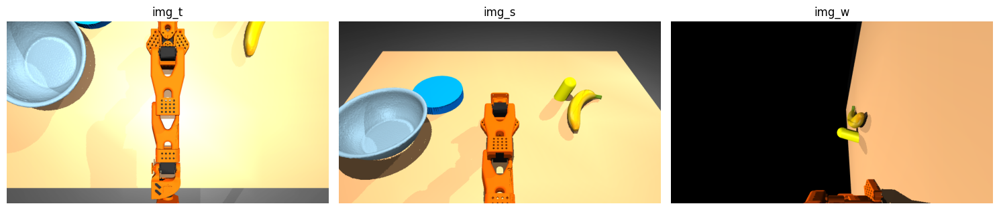

Action: [  0.24703489 147.50787565   0.64788997  -0.59926364   1.04820813
  -0.25080056]


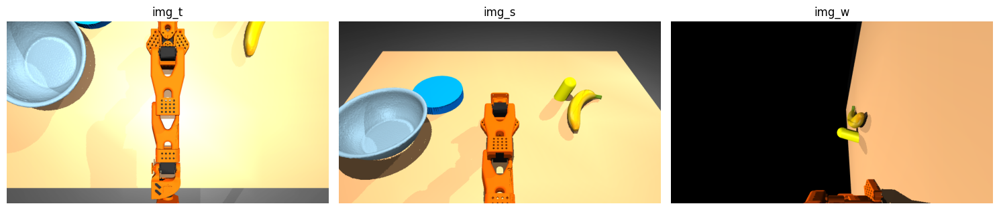

Action: [  0.26725361 151.14496766   0.85438472  -0.51086441   1.42785399
  -0.22998675]


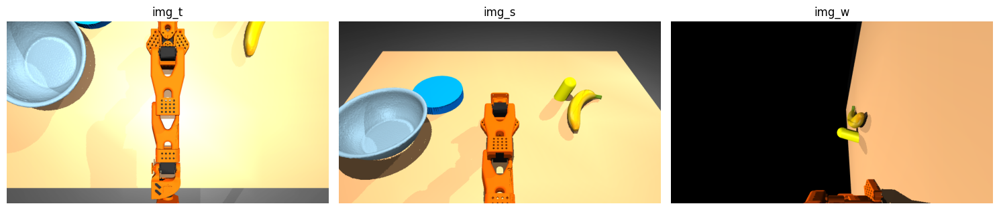

Action: [  0.31784495 154.61967928   1.09841767  -0.58946758   1.80226812
  -0.21833852]


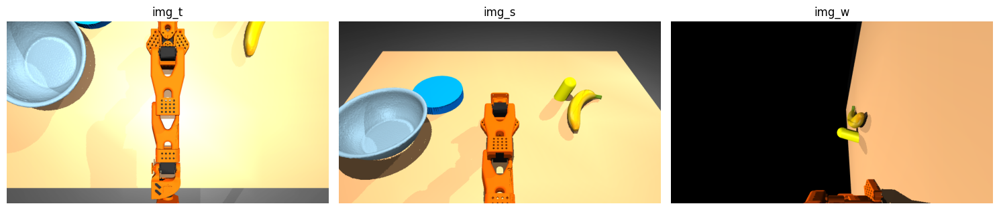

Action: [  0.41520456 157.91829742   1.39496596  -0.83800624   2.12829545
  -0.21248597]


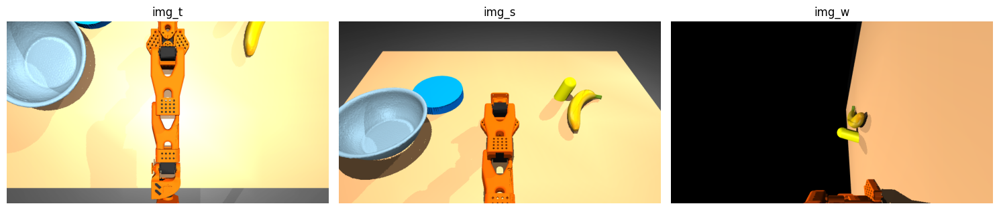

Action: [  0.57728307 161.02780392   1.70137797  -1.22832473   2.39425461
  -0.20963594]


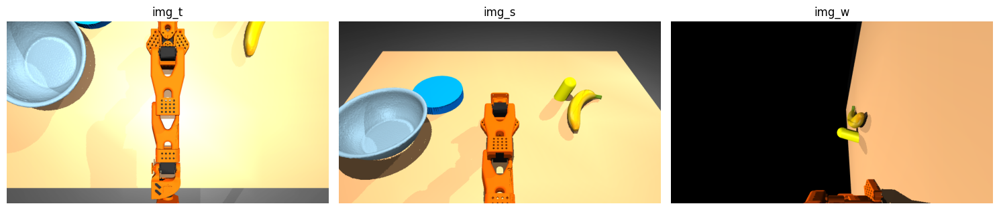

Action: [  0.81713409 163.93592699   1.97892421  -1.64728023   2.60220921
  -0.20827198]


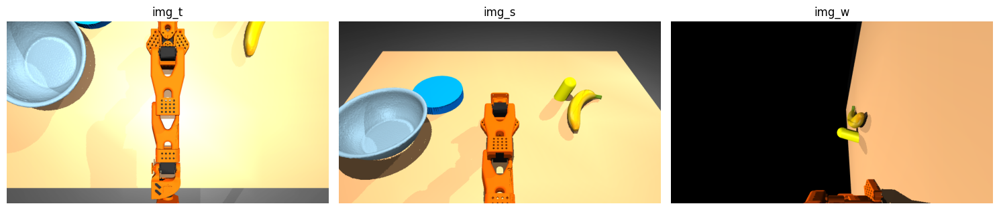

Action: [  1.10977783 166.63118961   2.20016763  -2.03085928   2.76536575
  -0.2076334 ]


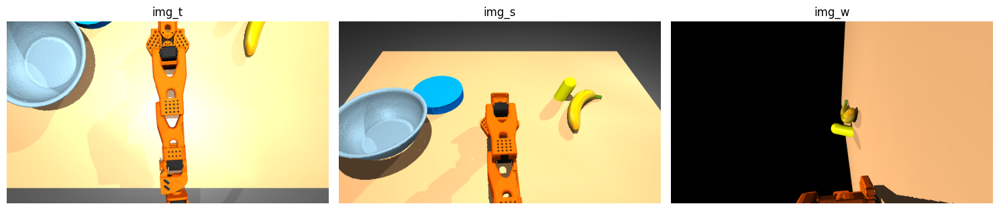

Action: [  1.35483093 169.10295479   2.37049239  -2.12876608   2.8879371
  -0.2073128 ]


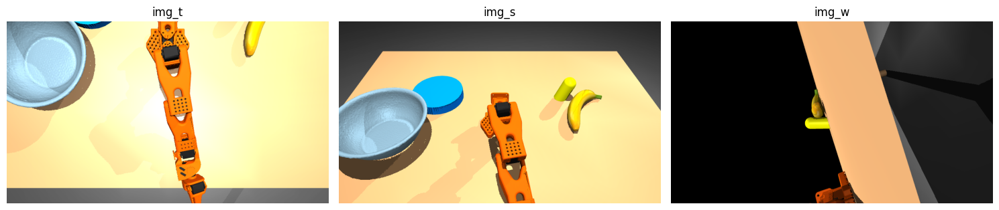

Action: [  1.51440265 171.3414676    2.49273652  -2.09122026   3.0031265
  -0.20718203]


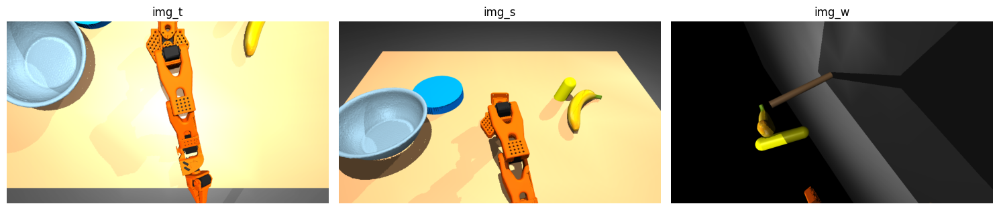

Action: [  1.6737873  173.33789367   2.59840815  -2.05422073   3.09141635
  -0.20712843]


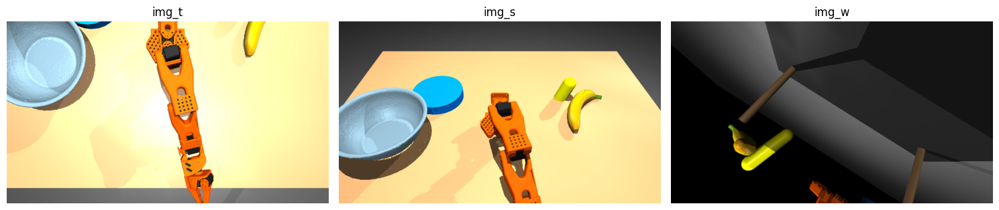

Action: [  1.81918412 175.08435401   2.68568677  -2.03239343   3.15287632
  -0.20714566]


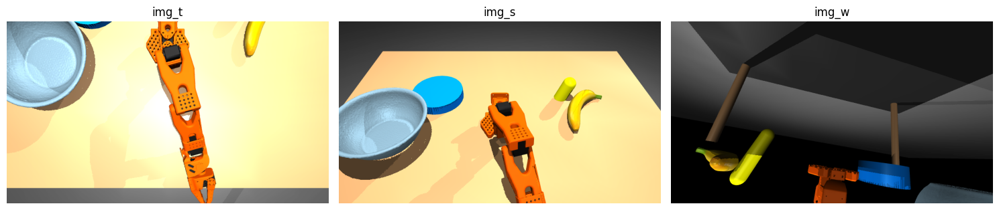

Action: [  1.90567633 176.57395614   2.74681077  -2.02142316   3.16129245
  -0.20731778]


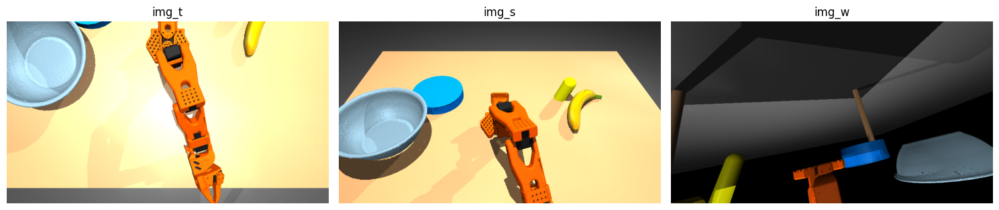

Action: [  1.958188   177.80082128   2.77993164  -2.01612112   3.15424626
  -0.20768359]


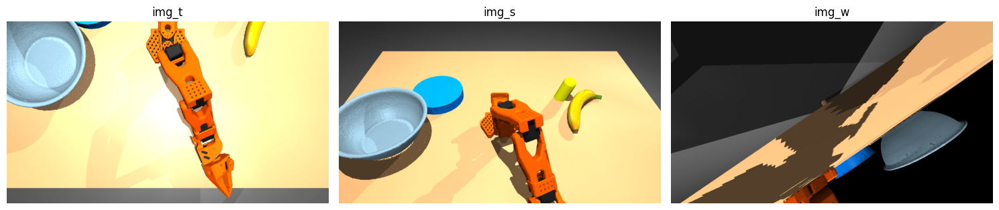

Action: [  1.9676718  178.76010755   2.78384374  -2.01312271   3.14831987
  -0.20762714]


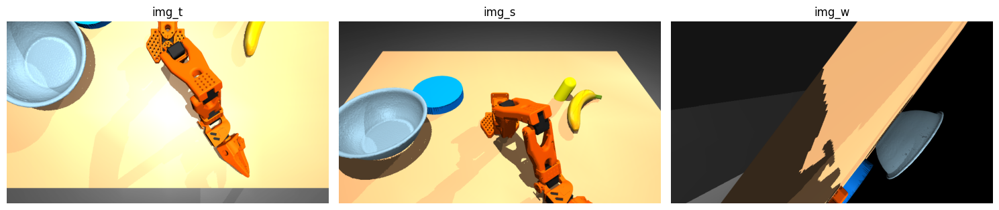

Action: [  1.96998138 179.44802909   2.78375776  -2.01136081   3.14469129
  -0.2074763 ]


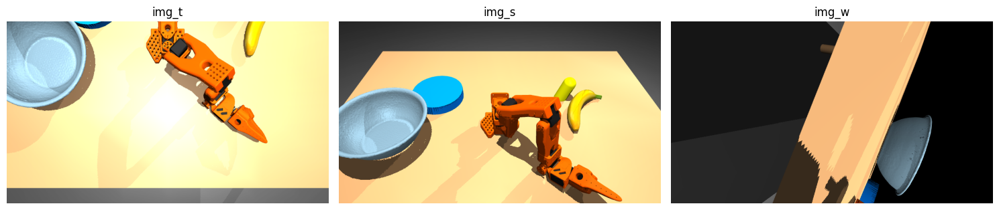

Action: [  1.9711227  179.86187099   2.78335293  -2.01042467   3.1430054
  -0.20736507]


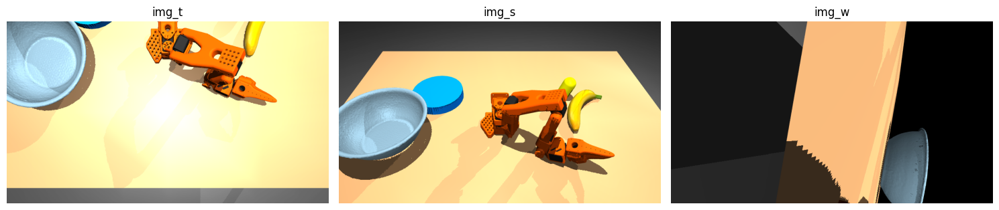

Action: [  1.9719831  180.           2.78296128  -2.0099294    3.14230472
  -0.2073035 ]


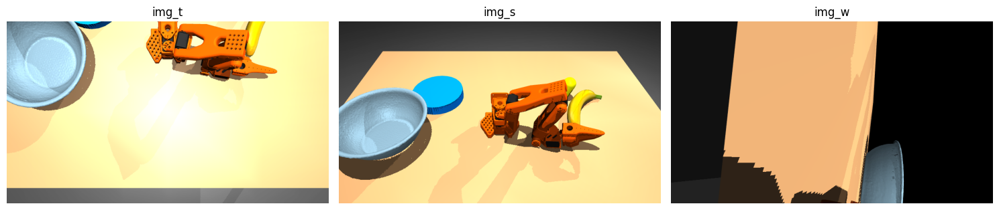

Action: [  1.97271838 179.86187099   2.78259342  -2.00966674   3.14202524
  -0.20728519]


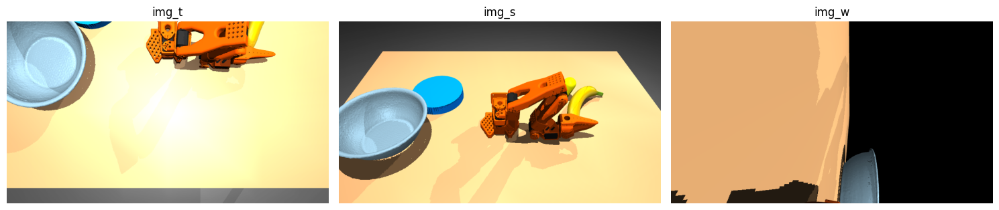

Action: [  1.97342262 179.44802909   2.78224953  -2.00953738   3.14193656
  -0.20727818]


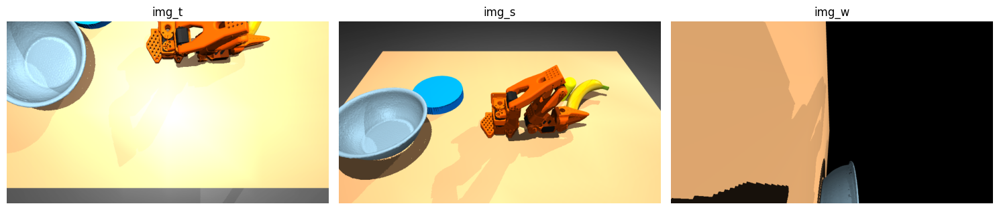

Action: [  1.97409805 178.76010755   2.78192239  -2.00947727   3.14191626
  -0.20726073]


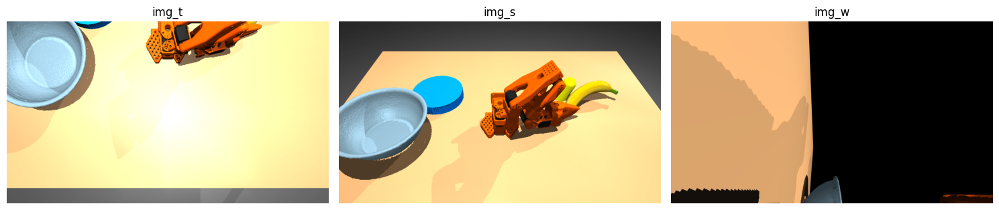

Action: [  1.97477142 177.80082128   2.78160972  -2.00944717   3.14191907
  -0.20724595]


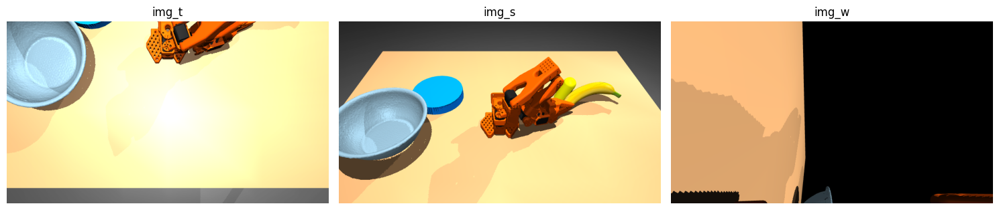

Action: [  1.97541619 176.57395614   2.78131094  -2.00943336   3.14192683
  -0.20723439]


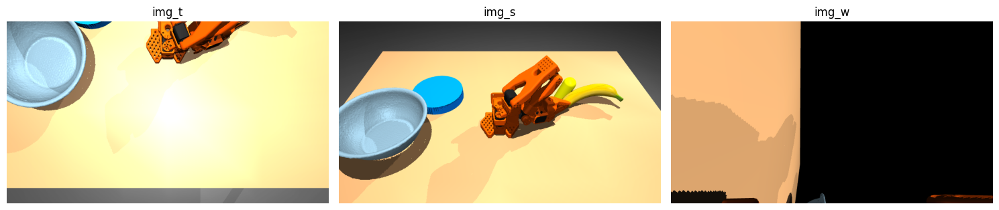

Action: [  1.97604047 175.08435401   2.78102427  -2.00942857   3.1419353
  -0.20722562]


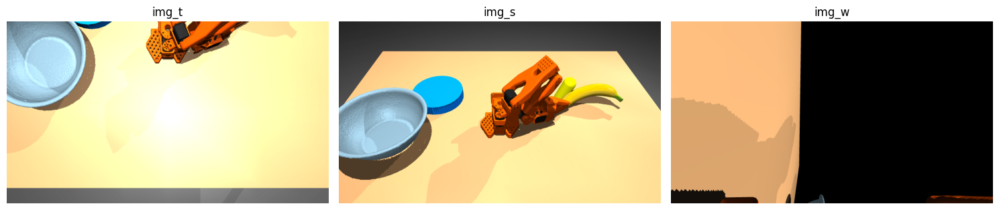

Action: [  1.97665343 173.33789367   2.78074715  -2.00942762   3.14194461
  -0.20721895]


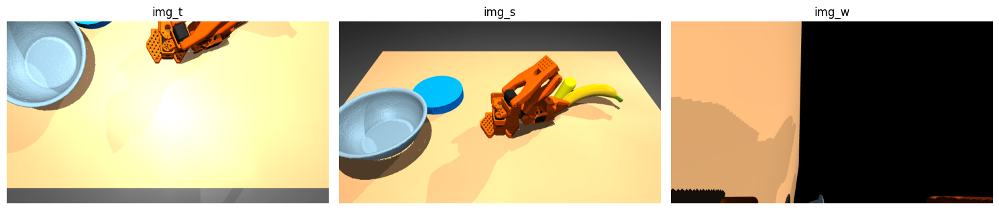

Action: [  1.97725472 171.3414676    2.78047991  -2.00943008   3.14195209
  -0.2072137 ]


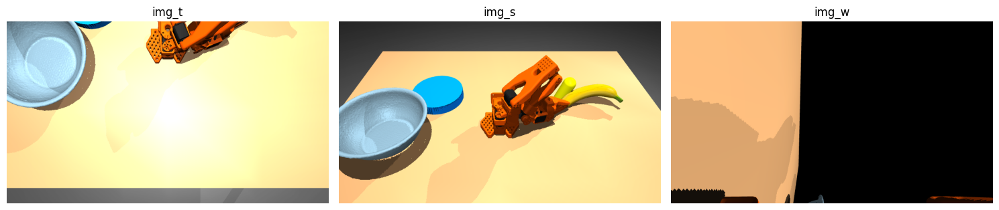

Action: [  1.97784219 169.10295479   2.78022136  -2.00943418   3.14195832
  -0.20720842]


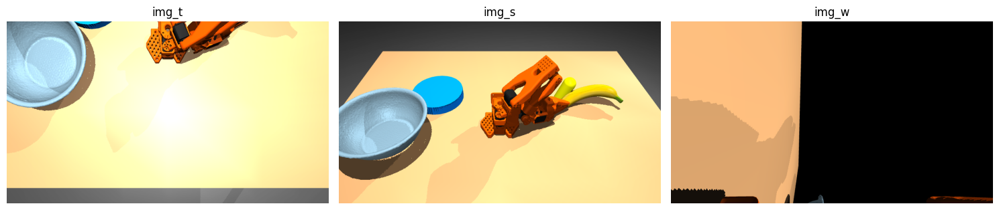

Action: [  1.97841973 166.63118961   2.77997286  -2.00943914   3.14196511
  -0.20721895]


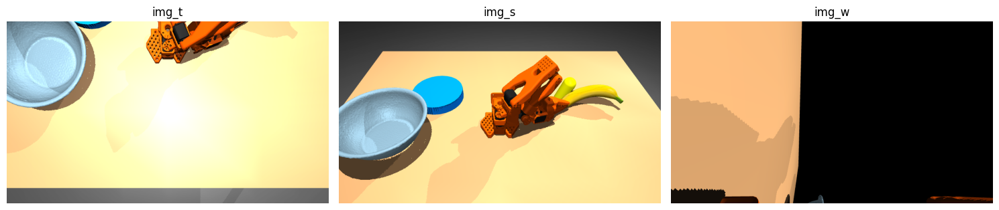

Action: [  1.97899901 163.93592699   2.77973126  -2.00944263   3.14197587
  -0.20724165]


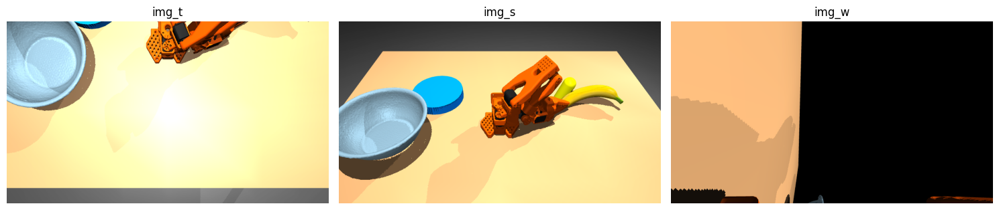

Action: [  1.97957891 161.02780392   2.77949573  -2.00944925   3.14197953
  -0.20723687]


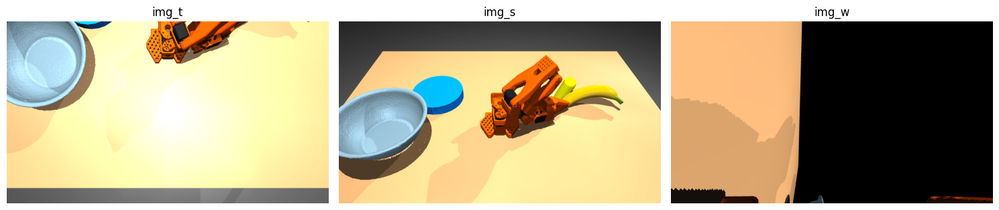

Action: [  1.98017041 157.91829742   2.77926508  -2.00945545   3.14198076
  -0.20722169]


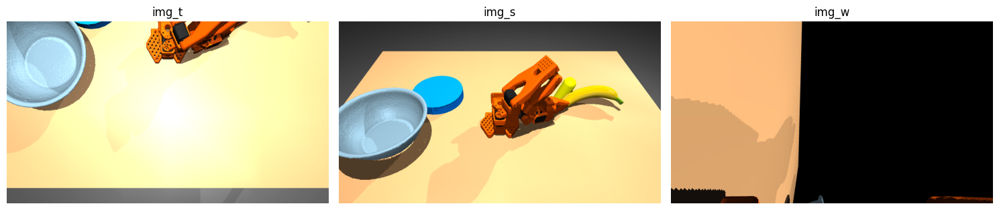

Action: [  1.98074309 154.61967928   2.77904031  -2.00946132   3.14198054
  -0.20720927]


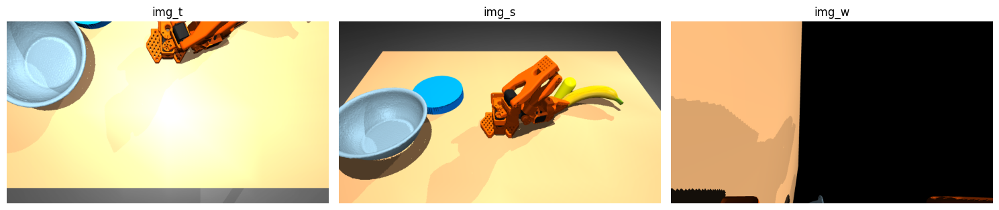

Action: [  1.98133428 151.14496766   2.77881781  -2.00946378   3.1419828
  -0.2071997 ]


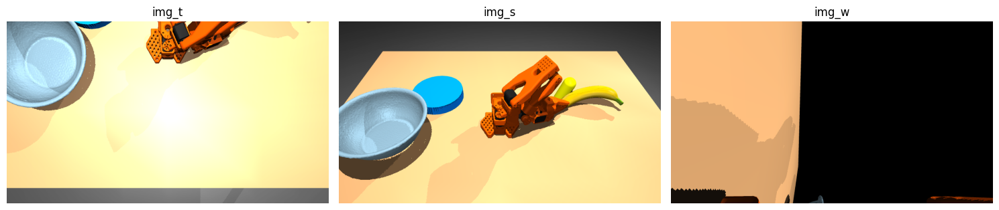

Action: [  1.98190318 147.50787565   2.77860111  -2.00946727   3.14197918
  -0.20719233]


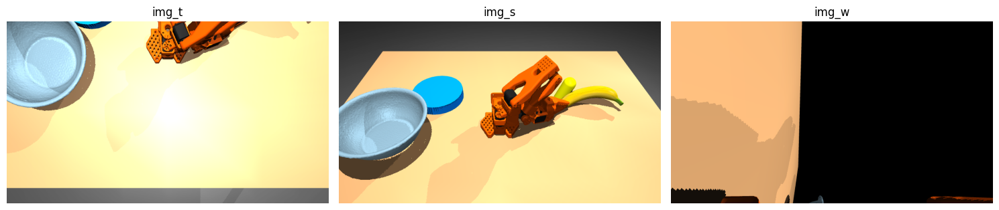

Action: [  1.98217398 143.72275719   2.7784225   -2.00949038   3.14138758
  -0.20718016]


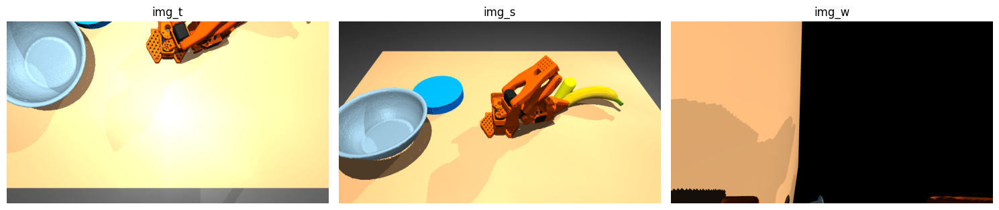

Action: [  1.98262365 139.80455041   2.77825384  -2.00952843   3.14216929
  -0.20716972]


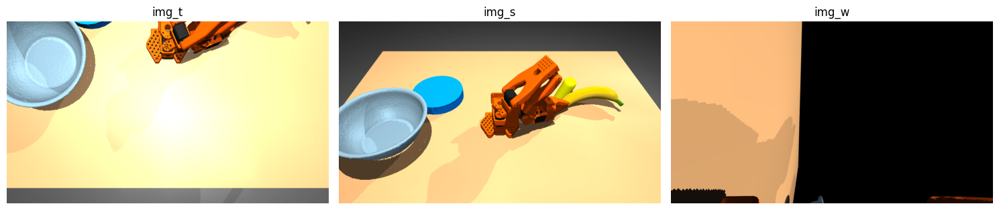

Action: [  1.98279506 135.76871869   2.77811385  -2.00955675   3.14175991
  -0.20717261]


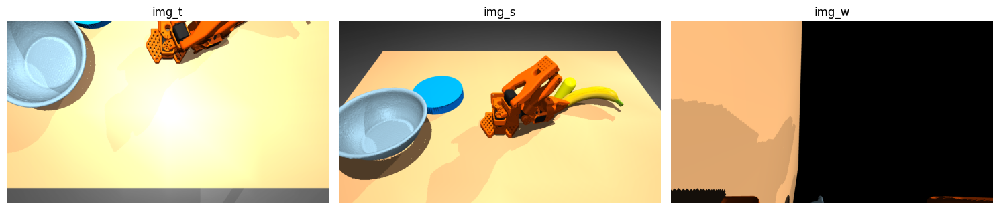

Action: [  1.98330417 131.63118961   2.77794961  -2.00957029   3.14242503
  -0.20718013]


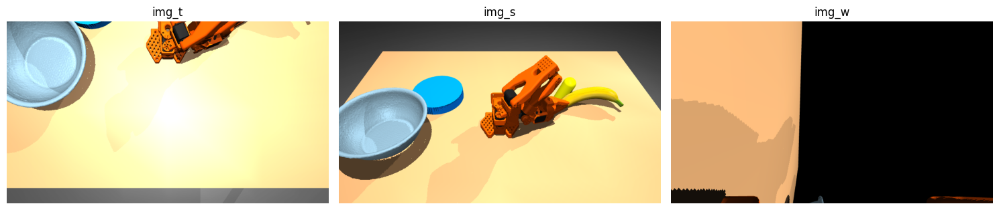

Action: [  1.98384667 127.4082921    2.77776208  -2.00955292   3.14227067
  -0.20718627]


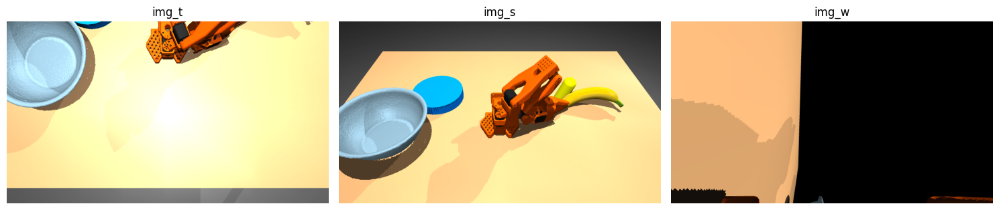

Action: [  1.98441568 123.11669202   2.77757071  -2.00953207   3.14212353
  -0.20720835]


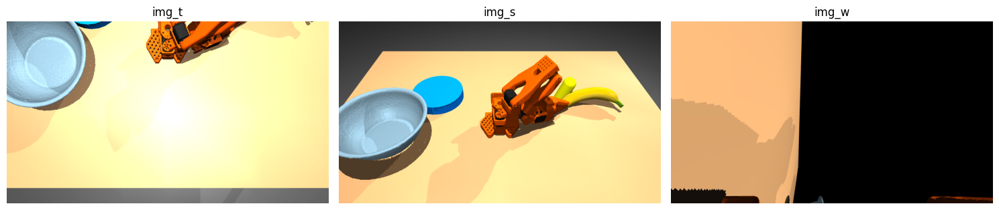

Action: [  1.98500173 118.77332635   2.77737648  -2.00951259   3.14205942
  -0.20722217]


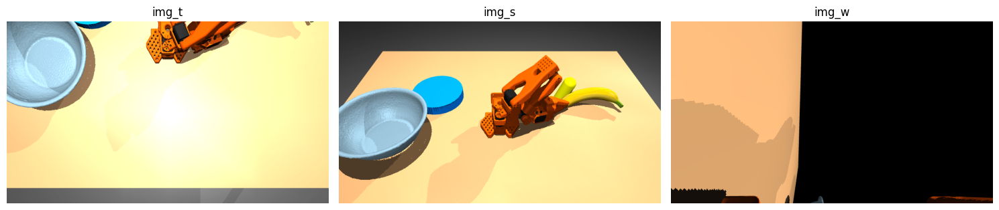

Action: [  1.98557689 114.39533637   2.77719507  -2.00950894   3.14203312
  -0.20720774]


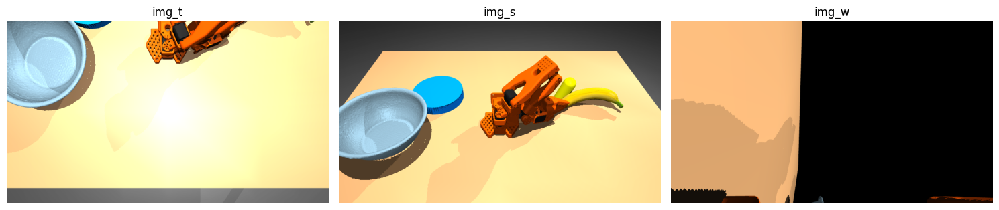

Action: [  1.98616027 110.           2.77701742  -2.00950862   3.14202364
  -0.20718687]


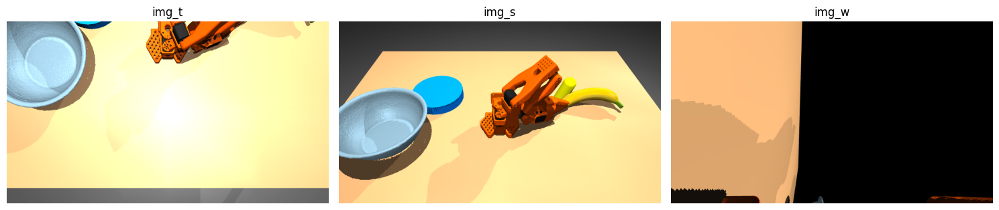

Action: [  1.9867331  105.60466363   2.77684133  -2.00950908   3.14201929
  -0.20716936]


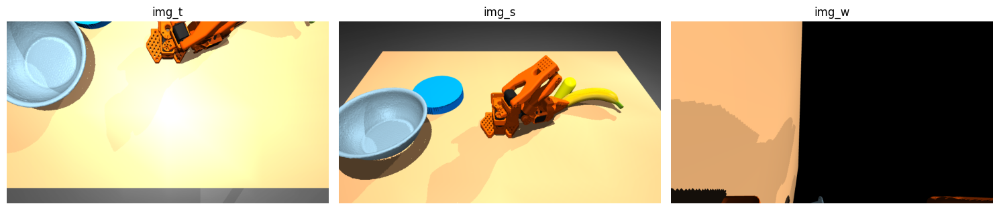

Action: [  1.98731473 101.22667365   2.77666343  -2.00950608   3.14201945
  -0.20715732]


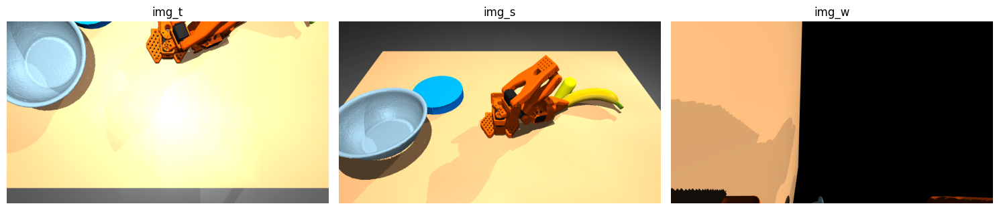

Action: [ 1.98788651 96.88330798  2.77648867 -2.0095059   3.14201746 -0.20715334]


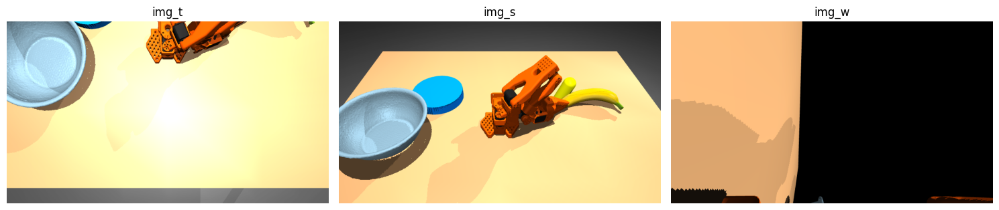

Action: [ 1.98844887 92.5917079   2.77631548 -2.00950375  3.14201973 -0.20717092]


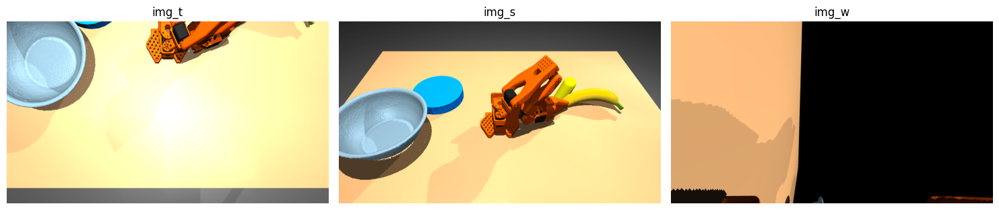

Action: [ 1.98901436 88.36881039  2.77614246 -2.0095036   3.14201811 -0.20717202]


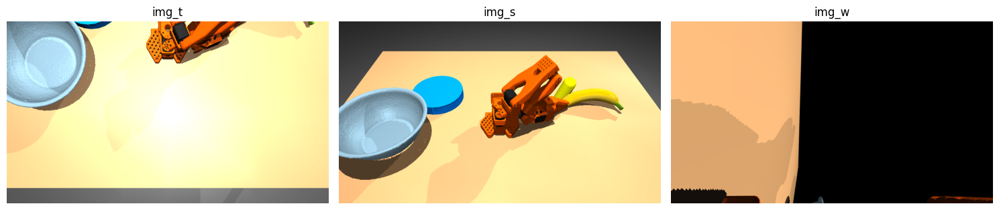

Action: [ 1.98957923 84.23128131  2.77597006 -2.00950335  3.14201639 -0.20717117]


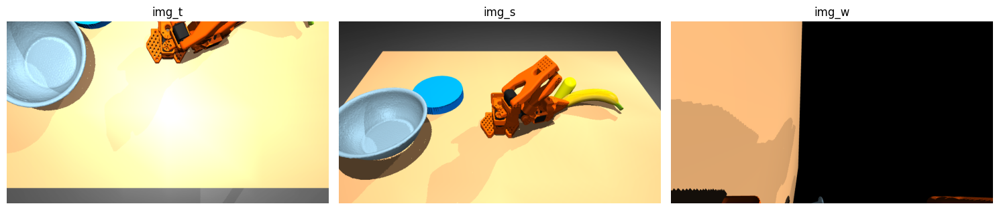

Action: [ 1.99013432 80.19544959  2.77579788 -2.00950068  3.14201848 -0.2071816 ]


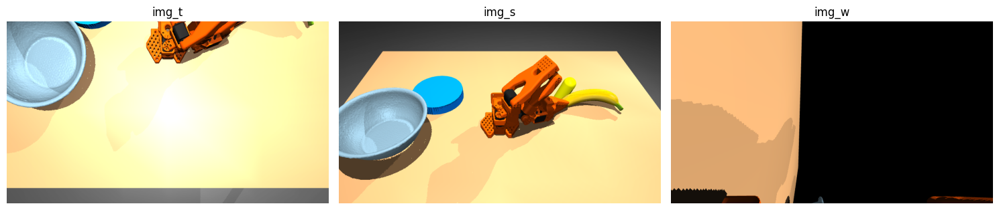

Action: [ 1.99069799 76.27724281  2.77562489 -2.00949944  3.14201669 -0.20717211]


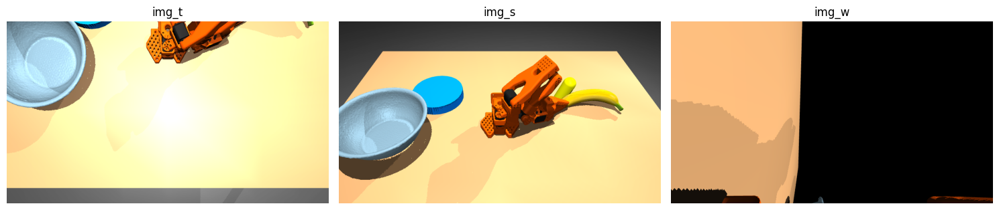

Action: [ 1.99126158 72.49212435  2.7754514  -2.00949848  3.14201304 -0.20715305]


KeyboardInterrupt: 

In [7]:
INFERENCE_DURATION = 10.0
FPS = 30
DISPLAY_INTERVAL = 3.0
dt = 1.0 / FPS

policy = MockPolicy()
total_steps = int(INFERENCE_DURATION * FPS)
last_display_time = 0
total_reward = 0

timestep = env.reset()
for step in range(total_steps):
    action = policy.select_action(timestep.observation)
    print(f"Action: {action}")
    timestep = env.step(action)
    obs, reward = timestep.observation, timestep.reward
    total_reward += reward
    plot_images(obs, cameras=cameras)
    time.sleep(dt)
    

print(f"Total reward: {total_reward}")